# Introduction to Geo-Visualization
## DATA 601

Additional Resources:

In this notebook, we'll explore libraries that support geographic data visualization. In particular, we'll be looking at [GeoPandas](http://geopandas.org/) and its integration with [matplotlib](http://geopandas.org/mapping.html). 

[Plotly](https://plot.ly/python/maps/) supports interactive geo-visualization capabilities on top of base maps provided by [mapbox](https://www.mapbox.com/). 

## Topics

- Geo-visualization with `GeoPandas` and `matplotlib`<br>
- Geo-visualization with `plotly.express`.  

In [84]:
import numpy as np
import pandas as pd
import geopandas as gpd

import matplotlib as mpl
import matplotlib.pyplot as plt

import plotly.express as px

#%matplotlib inline
mpl.rcParams['figure.dpi']= 100
mpl.style.use('ggplot')

print(gpd.__version__)

0.14.4


### GeoPandas

- Inherits from pandas. Provides the following two data structures: `GeoSeries` and `GeoDataFrame`.


- A `GeoSeries` is a `Series` where each entry describes a geometric shape in _vector_ format. The following shapes are supported:<br>
  - Points / Multi-points
  - Lines / Multi-lines
  - Polygons / Multi-polygons
  
  
- A `GeoDataFrame` is a `pandas` `DataFrame` with a special 'geometry' column that contains a `GeoSeries`.


- Provides methods to convert between different geospatial coordinate systems. 


### Read GeoJSON Data

GeoJSON is a commonly used format for storing data associated with regions defined through geographic coordinates.
In this notebook, we'll look at the Census by Community dataset for Calgary.

Download the dataset (in GeoJSON format) from the following URL:
[Census by Community 2019](https://data.calgary.ca/Demographics/Census-by-Community-2019/rkfr-buzb)

In [85]:
# Let's read the dataset through geopandas as a GeoDataFrame

census_file = './Census by Community 2019.geojson'
cendf = gpd.read_file(census_file)
display(cendf.head())
display(type(cendf))


,other_res,comm_structure,dup_occpd,mfh_owned,res_comm,name,twn_no_res,hotel_cnt,mul_no_res,apt_uc,...,mf_65_74,mul_na,other_75,oth_no_res,other_15_19,ownshp_cnt,oth_vacant,mfh_uc,prsch_chld,geometry
0,0.0,BUILDING OUT,343.0,0.0,0.0,LEGACY,2.0,0.0,0.0,2.0,...,252.0,0.0,0,0.0,0,1826.0,0.0,0.0,850.0,"MULTIPOLYGON (((-114.02200 50.86308, -114.0213..."
1,1.0,1950s,354.0,0.0,2.0,HIGHLAND PARK,0.0,0.0,0.0,1.0,...,229.0,0.0,0,1.0,0,645.0,0.0,0.0,325.0,"MULTIPOLYGON (((-114.06916 51.09565, -114.0667..."
2,0.0,2000s,171.0,0.0,0.0,CORNERSTONE,0.0,0.0,0.0,219.0,...,118.0,0.0,0,0.0,0,708.0,0.0,0.0,199.0,"MULTIPOLYGON (((-113.91840 51.17607, -113.9166..."
3,1.0,1950s,497.0,0.0,5.0,MONTGOMERY,0.0,5.0,0.0,0.0,...,285.0,0.0,0,0.0,0,1027.0,5.0,0.0,328.0,"MULTIPOLYGON (((-114.16458 51.08145, -114.1644..."
4,1.0,1960s/1970s,570.0,0.0,0.0,TEMPLE,1.0,0.0,0.0,0.0,...,941.0,0.0,0,1.0,0,2460.0,0.0,0.0,908.0,"MULTIPOLYGON (((-113.93513 51.09608, -113.9351..."


geopandas.geodataframe.GeoDataFrame

In [86]:

# There's a geometry column which holds the geometric information as a GeoSeries
display(type(cendf.geometry))


geopandas.geoseries.GeoSeries

## Understanding Geospatial Data and Projections

### Geospatial Data:

Geospatial data involves any information that has a geographic component—i.e., data that is linked to specific locations on the Earth.
- In our case, the data represents community polygons (areas defined by boundaries) and is stored in a file (e.g., a GeoJSON file).
- Coordinates (lat/long): Latitude refers to the north-south position, and longitude refers to the east-west position on the Earth's surface.
- Coordinates in this format are typically expressed in degrees.

## Coordinate Reference Systems (CRS):

### What is a CRS?

- A Coordinate Reference System (CRS) defines how the two-dimensional, projected map in your GIS relates to real places on the Earth.
- It includes details such as the projection method and the datum (a model of the Earth) used.
A CRS determines how distances and angles are represented, and it is crucial for accurate spatial analysis.

In [87]:

# It looks like the coordinates for the community polygons are in lat/long format.
# The projection can be setup appropriately.
# For further details on managing projections, see:
# https://geopandas.org/en/stable/docs/user_guide/projections.html

display(cendf.crs)

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [88]:
cendf.geometry = cendf.geometry.set_crs(epsg=4326)
display(cendf.geometry)


0      MULTIPOLYGON (((-114.02200 50.86308, -114.0213...
1      MULTIPOLYGON (((-114.06916 51.09565, -114.0667...
2      MULTIPOLYGON (((-113.91840 51.17607, -113.9166...
3      MULTIPOLYGON (((-114.16458 51.08145, -114.1644...
4      MULTIPOLYGON (((-113.93513 51.09608, -113.9351...
                             ...                        
301    MULTIPOLYGON (((-114.27030 51.10060, -114.2702...
302    MULTIPOLYGON (((-114.09474 51.15426, -114.0947...
303    MULTIPOLYGON (((-114.01581 50.98069, -114.0148...
304    MULTIPOLYGON (((-114.07153 51.02885, -114.0715...
305    MULTIPOLYGON (((-113.98171 51.06697, -113.9817...
Name: geometry, Length: 306, dtype: geometry

In [89]:
# convert to world mercator which has units of meters
# https://epsg.io/3395

cendf.geometry = cendf.geometry.to_crs(epsg=3395)
display(cendf.head())
display(cendf.crs)


,other_res,comm_structure,dup_occpd,mfh_owned,res_comm,name,twn_no_res,hotel_cnt,mul_no_res,apt_uc,...,mf_65_74,mul_na,other_75,oth_no_res,other_15_19,ownshp_cnt,oth_vacant,mfh_uc,prsch_chld,geometry
0,0.0,BUILDING OUT,343.0,0.0,0.0,LEGACY,2.0,0.0,0.0,2.0,...,252.0,0.0,0,0.0,0,1826.0,0.0,0.0,850.0,"MULTIPOLYGON (((-12692870.539 6563947.026, -12..."
1,1.0,1950s,354.0,0.0,2.0,HIGHLAND PARK,0.0,0.0,0.0,1.0,...,229.0,0.0,0,1.0,0,645.0,0.0,0.0,325.0,"MULTIPOLYGON (((-12698121.105 6604958.485, -12..."
2,0.0,2000s,171.0,0.0,0.0,CORNERSTONE,0.0,0.0,0.0,219.0,...,118.0,0.0,0,0.0,0,708.0,0.0,0.0,199.0,"MULTIPOLYGON (((-12681337.982 6619187.684, -12..."
3,1.0,1950s,497.0,0.0,5.0,MONTGOMERY,0.0,5.0,0.0,0.0,...,285.0,0.0,0,0.0,0,1027.0,5.0,0.0,328.0,"MULTIPOLYGON (((-12708742.821 6602449.075, -12..."
4,1.0,1960s/1970s,570.0,0.0,0.0,TEMPLE,1.0,0.0,0.0,0.0,...,941.0,0.0,0,1.0,0,2460.0,0.0,0.0,908.0,"MULTIPOLYGON (((-12683200.328 6605033.675, -12..."


<Projected CRS: EPSG:3395>
Name: WGS 84 / World Mercator
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: World between 80°S and 84°N.
- bounds: (-180.0, -80.0, 180.0, 84.0)
Coordinate Operation:
- name: World Mercator
- method: Mercator (variant A)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [90]:
# Let's index by community name
cendf.set_index('name', inplace=True)
display(cendf.head())



,other_res,comm_structure,dup_occpd,mfh_owned,res_comm,twn_no_res,hotel_cnt,mul_no_res,apt_uc,oth_strty,...,mf_65_74,mul_na,other_75,oth_no_res,other_15_19,ownshp_cnt,oth_vacant,mfh_uc,prsch_chld,geometry
name,,,,,,,,,,,,,,,,,,,,,
LEGACY,0.0,BUILDING OUT,343.0,0.0,0.0,2.0,0.0,0.0,2.0,0.0,...,252.0,0.0,0,0.0,0,1826.0,0.0,0.0,850.0,"MULTIPOLYGON (((-12692870.539 6563947.026, -12..."
HIGHLAND PARK,1.0,1950s,354.0,0.0,2.0,0.0,0.0,0.0,1.0,3.0,...,229.0,0.0,0,1.0,0,645.0,0.0,0.0,325.0,"MULTIPOLYGON (((-12698121.105 6604958.485, -12..."
CORNERSTONE,0.0,2000s,171.0,0.0,0.0,0.0,0.0,0.0,219.0,0.0,...,118.0,0.0,0,0.0,0,708.0,0.0,0.0,199.0,"MULTIPOLYGON (((-12681337.982 6619187.684, -12..."
MONTGOMERY,1.0,1950s,497.0,0.0,5.0,0.0,5.0,0.0,0.0,13.0,...,285.0,0.0,0,0.0,0,1027.0,5.0,0.0,328.0,"MULTIPOLYGON (((-12708742.821 6602449.075, -12..."
TEMPLE,1.0,1960s/1970s,570.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,941.0,0.0,0,1.0,0,2460.0,0.0,0.0,908.0,"MULTIPOLYGON (((-12683200.328 6605033.675, -12..."


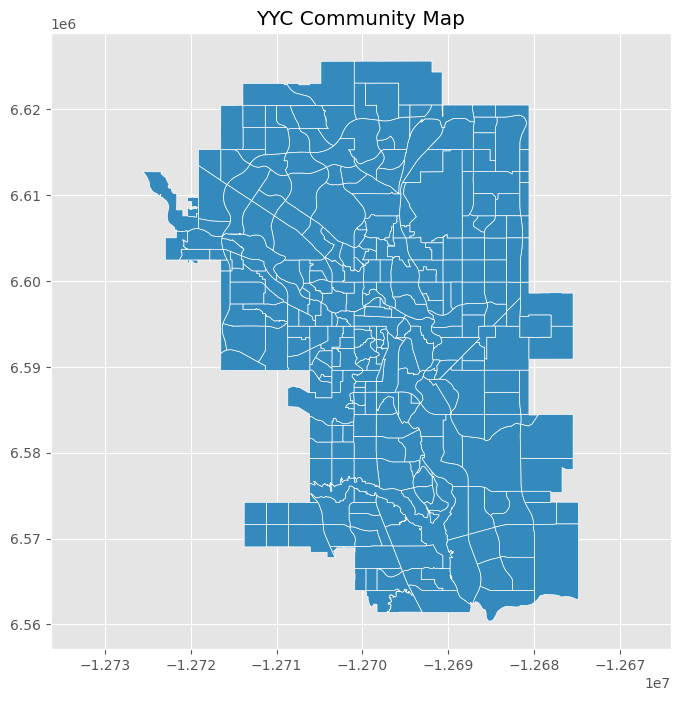

In [91]:
# To visualize all the geometric entities, we can use the built-in plot command

fig = plt.figure()
axis = fig.add_subplot(1,1,1)

## The following can be used to control the map projection

## Play with projections.
## See https://geopandas.org/en/stable/docs/user_guide/projections.html

# cendf = cendf.to_crs(epsg=4326) # for lat/long
cendf = cendf.to_crs(epsg=3395) # for mercator 



cendf.plot(ax=axis, edgecolor='white')

# can also specify a column to plot, more on this below.

plt.axis('equal')
plt.title('YYC Community Map')
fig.set_size_inches(8,8)




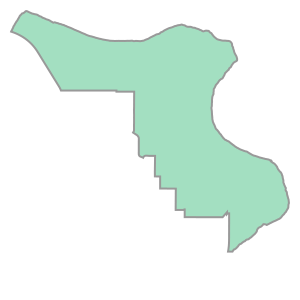

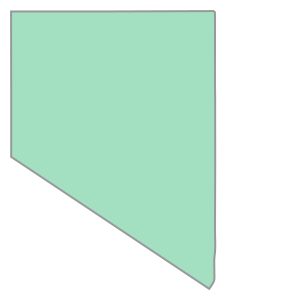

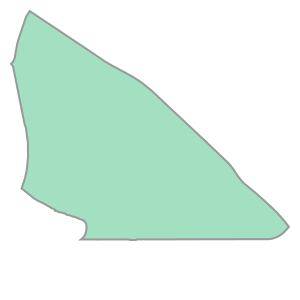

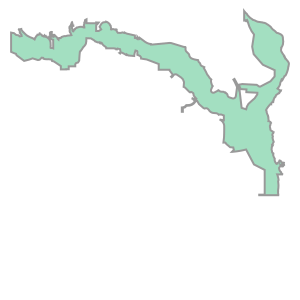

name
LEGACY           1.520236e+07
HIGHLAND PARK    3.458921e+06
CORNERSTONE      1.946280e+07
MONTGOMERY       7.447214e+06
TEMPLE           6.627375e+06
dtype: float64


 Distance to downtown


name
LEGACY           31262.067942
HIGHLAND PARK     5466.599895
CORNERSTONE      20072.336484
MONTGOMERY        7638.984567
TEMPLE           12217.765229
dtype: float64

In [92]:
# Indivisual geomteric entities can be visualized. 
# We can do this via the integration between geopandas and matplotlib

# If we select a particular geometry cell, Jupyter will display it

display(cendf.loc['INGLEWOOD','geometry'], cendf.loc['ROCKY RIDGE', 'geometry'], 
        cendf.loc['VARSITY', 'geometry'], cendf.loc['FISH CREEK PARK','geometry'])

# Basic methods to compute areas and bounds are also provided.
# Geopandas may generate a warning about projections if the coordinate system is not setup 
# properly.

cendf = cendf.to_crs(epsg=3395) # for mercator 

# Area of the geometric entitites
display(cendf['geometry'].area.head())

# Euclidean distance to Downtown for all the communities 
print("\n Distance to downtown")
display(cendf['geometry'].distance(cendf.loc['DOWNTOWN COMMERCIAL CORE', 'geometry']).head())


count      306.000000
mean      4193.388889
std       5046.790123
min          0.000000
25%          0.000000
50%       2363.000000
75%       6897.250000
max      25710.000000
Name: res_cnt, dtype: float64

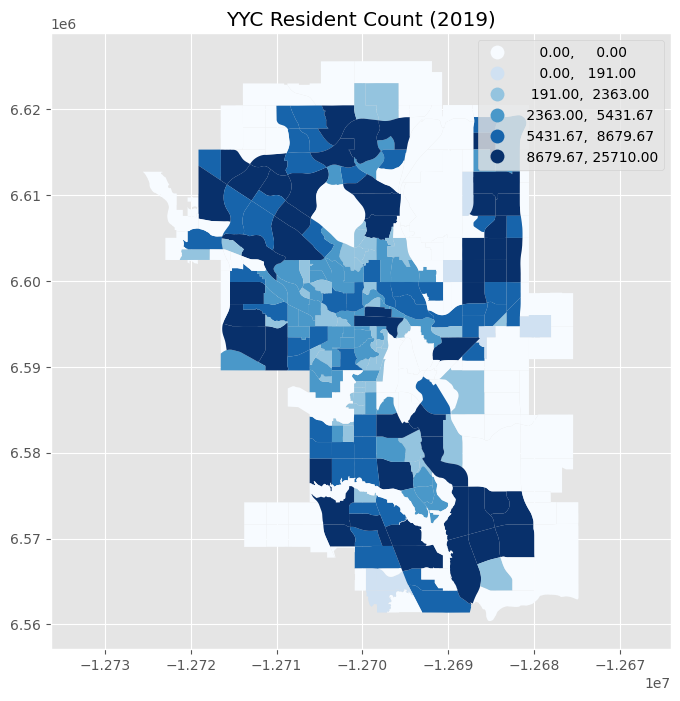

In [93]:
## We may want to colormap the geometric entities according to a property
## to produce a choropleth map.
## This can be done by specifying a column from the GeoDataFrame.

cendf['res_cnt'] = cendf['res_cnt'].astype(float).astype(int) # convert to an integer
display(cendf['res_cnt'].describe())

fig = plt.figure()
axis = fig.add_subplot(1,1,1)

# In the following, 'scheme' options require the 'mapclassify' package.
# Try setting scheme to 'equal_interval' and 'quantiles'. 
cendf.plot(ax=axis, column='res_cnt', scheme='quantiles', k=6, cmap='Blues', legend=True) 
plt.axis('equal')

plt.title('YYC Resident Count (2019)')
fig.set_size_inches(8,8)



### Scatterplot on a Map

- We can also plot points (given in geographic coordinates) on a base map.
- Let's display micromobility locations on YYC base map
- Download the dataset from the following URL (for offline use): 
  [Micromobility Locations](https://data.calgary.ca/Transportation-Transit/Micromobility-Locations-in-Calgary/a3ya-gwgt) 
  
  There is also a live feed which at the time of writing this notebook is accessible through the following URL:
  https://data.calgary.ca/resource/8mci-3bzr.csv

In [94]:
## We can also perform a scatterplot on a map.
## Let's display micromobility locations on YYC base map.

## But first a bit of wrangling to extract the lat / long and build a 
## GeoSeries consisting of Point objects

# Use the live feed
mm_location_file = "https://data.calgary.ca/resource/8mci-3bzr.csv"
mmlocs = pd.read_csv(mm_location_file,usecols=["timestamp","latitude", "longitude"], parse_dates=['timestamp'])

from shapely.geometry import Point # used to represent a single point in space.

mmlocs['coordinates'] = list(zip(mmlocs["longitude"], mmlocs["latitude"]))
mmlocs['coordinates'] = mmlocs['coordinates'].apply(Point)
locsdf = gpd.GeoDataFrame(mmlocs, geometry='coordinates')
locsdf = locsdf.set_crs(epsg=4326) # interpret the coordinates as lat/long


display(locsdf.head()) 
display(locsdf.dtypes)

,timestamp,latitude,longitude,coordinates
0,2025-02-11 14:30:07,NaN,NaN,POINT EMPTY
1,1969-12-31 17:00:00,NaN,NaN,POINT EMPTY


timestamp      datetime64[ns]
latitude              float64
longitude             float64
coordinates          geometry
dtype: object

/Users/tauhi/anaconda3/envs/nlp/lib/python3.12/site-packages/geopandas/plotting.py:979: UserWarning:

The GeoSeries you are attempting to plot is composed of empty geometries. Nothing has been displayed.



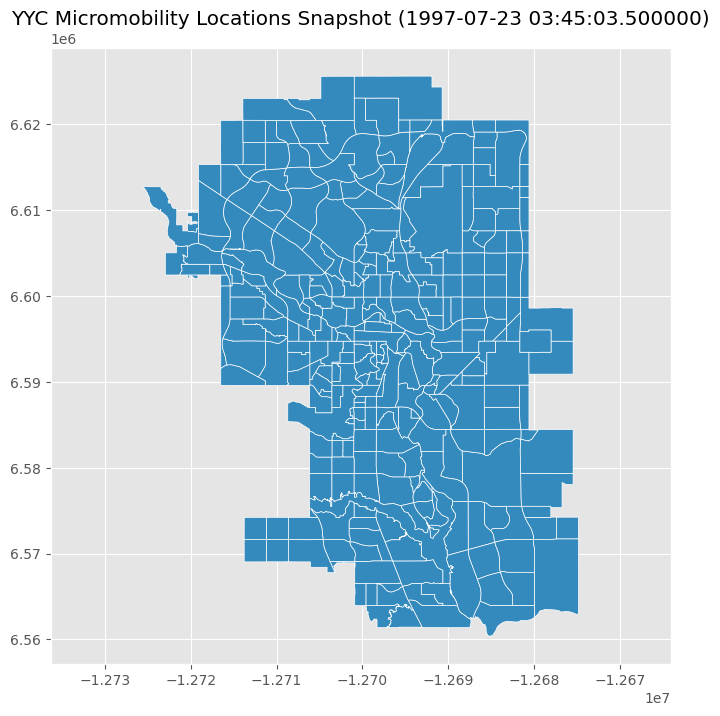

In [95]:
# Now plot over the base YYC map

fig = plt.figure()
axis = fig.add_subplot(1,1,1)

# set the projection to mercator 
cendf = cendf.to_crs(epsg=3395) #3395 for mercator
locsdf = locsdf.to_crs(epsg=3395) 

cendf.plot(ax=axis, edgecolor='white')
locsdf.plot(
    ax=axis, 
    markersize=50, 
    color='red', 
    marker='o', 
    alpha=0.8, 
    zorder=5  # ensures points are drawn on top
)




plt.axis('equal')
plt.title('YYC Micromobility Locations Snapshot (' + str(locsdf['timestamp'].mean()) + ')')
fig.set_size_inches(8,8)

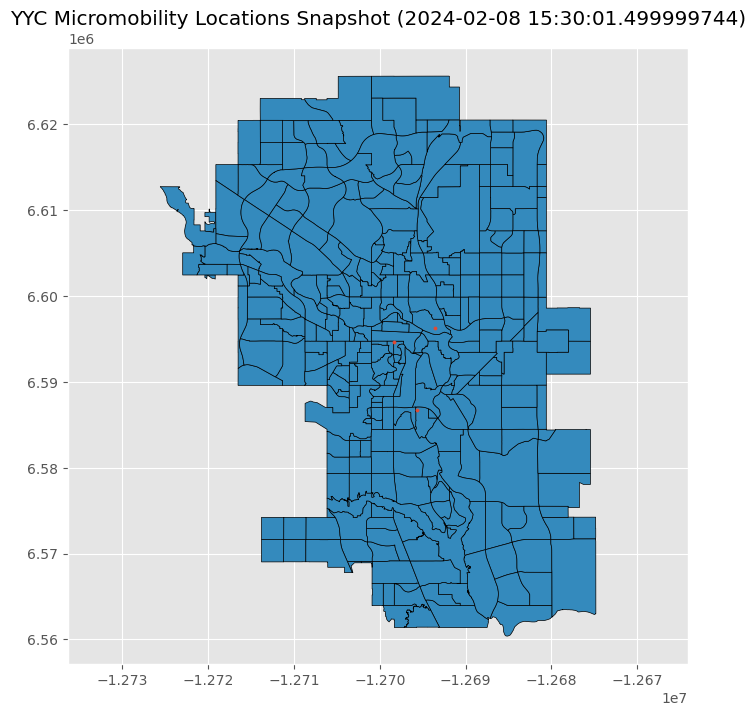

## Mapping in Plotly

- Matplotlib maps are good for offline use, lack interactivity.

- Plotly uses _tiled maps_ provided by mapbox as the underlying interactive base maps.
  - Some mapbox base maps require an [access token](https://docs.mapbox.com/help/getting-started/access-tokens/) but there are also free ones. 
  - Untiled (outline) maps are also supported.
- We'll look at the following examples that work with geopandas dataframes:
  - [px.scatter_mapbox()](https://plotly.com/python/scattermapbox/)
  - [px.choropleth_mapbox()](https://plotly.com/python/mapbox-county-choropleth/)

In [96]:
# Micromobility locations via px.scatter_mapbox()

locsdf = locsdf.to_crs(epsg=4326)
fig = px.scatter_mapbox(locsdf,
                        lat=locsdf.geometry.y,
                        lon=locsdf.geometry.x,
                        hover_name="timestamp",
                        center={"lat": 51.0486, "lon": -114.0708}, # Calgary
                        mapbox_style='open-street-map',
                        zoom=9, 
                        title='YYC Micromobility Locations Snapshot (' + str(locsdf['timestamp'].mean()) + ')')

fig.update_layout(margin={"r":50,"t":50,"l":50,"b":50}, 
                  autosize=True,
                  height=600 )
fig.show()

/var/folders/xm/dtk1g2nx457gfkp94_xvn6bm0000gn/T/ipykernel_62480/2265423904.py:4: DeprecationWarning:

*scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



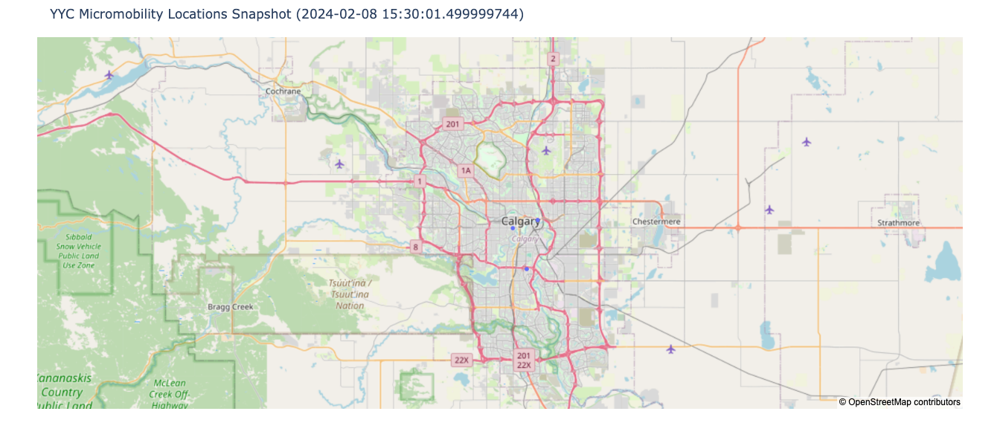

In [97]:
# Choropleth map of calgary resident count via px.choropleth_mapbox()

cendf = cendf.to_crs(epsg=4326)

# Need to be careful with the options or you'll end up with just the base map
fig = px.choropleth_mapbox(cendf, geojson=cendf,
                           locations=cendf.index, 
                           color="res_cnt",
                           color_continuous_scale = 'YlGn',
                           center={"lat": 51.0486, "lon": -114.0708}, # Calgary
                           mapbox_style="carto-positron",
                           opacity=0.5,
                           zoom=9, 
                           title = 'YYC Resident Count (2019)')

fig.update_layout(margin={"r":50,"t":50,"l":50,"b":50}, 
                  autosize=True,
                  height=600 )
fig.show()


/var/folders/xm/dtk1g2nx457gfkp94_xvn6bm0000gn/T/ipykernel_62480/392931571.py:6: DeprecationWarning:

*choropleth_mapbox* is deprecated! Use *choropleth_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/

